In [2]:
from sklearn.datasets import load_files       
from keras.utils import np_utils
import numpy as np
from glob import glob
import cv2
import tensorflow as tf

# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    mri_files = np.array(data['filenames'])
    mri_targets = np_utils.to_categorical(np.array(data['target']), 133)
    return mri_files, mri_targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset('./mri/train')

# load ordered list of dog names
pathology = [item[25:-1] for item in glob('mri/train/*/')]

# print statistics about the dataset
print('There are %d total mri categories.' % len(pathology))
print('There are %s total mri images.\n' % str(len(train_files)))

There are 1 total mri categories.
There are 4 total mri images.



In [253]:
import os
for filename in os.listdir("."):
    os.rename()
    

checkpoints
1511.06434.pdf
.ipynb_checkpoints
mri
DCGAN.ipynb
DCGAN_Exercises.ipynb
data
untitled.txt
assets
Untitled.ipynb


In [257]:
import os
for filename in os.listdir("./mri/train"):
    for num, files in enumerate(os.listdir("./mri/train/{}".format(filename))):
#     if filename.startswith("cheese_"):
#     os.rename(filename, filename[7:])
        os.rename("./mri/train/{}/{}".format(filename, files), "./mri/trainSamples/{}/{}img.jpeg".format(filename, num))

In [226]:
class LoadResize(object):
    def __init__(self, img_path, size):
        self.img_path = img_path
        self.size = size
        self.img_out = np.array([])
        
    def Run(self):
        updated_path = []
        y = []
        for path in self.img_path:
            img = cv2.imread(path)
            try:
                img = cv2.resize(img, self.size)
                img = img.reshape(1, self.size[0], self.size[1], 3)
                if self.img_out.size:
                    self.img_out = np.append(self.img_out, img, axis=0)
                else:
                    self.img_out = img
                updated_path.append(path)
                if 'meningioma' in path:
                    y.append([0])
                elif 'metastases' in path:
                    y.append([1])
                else:
                    y.append([2])
            except:
                pass
        return self.img_out, np.array(y), updated_path

In [227]:
img_path = train_files
size = (64, 64)
images_resize = LoadResize(img_path, size)
X, y, path = images_resize.Run()

In [228]:
trainset = {'X': X,
            'y': y}

In [229]:
import matplotlib.pyplot as plt
%matplotlib inline

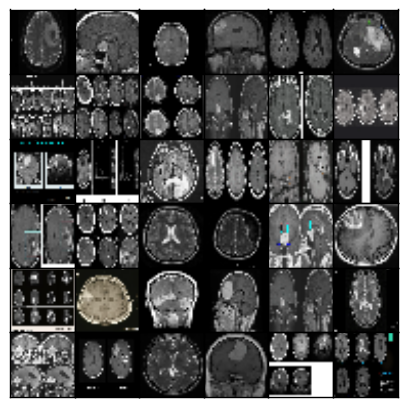

In [230]:
idx = np.random.randint(0, X.shape[0], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(X[ii,:,:,::], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

In [231]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [232]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

In [233]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

In [234]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

In [235]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

In [236]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

In [237]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

In [238]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

In [239]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

In [240]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

In [243]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 16
epochs = 50
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 2.4391... Generator Loss: 0.1775
Epoch 1/25... Discriminator Loss: 0.5643... Generator Loss: 2.1489
Epoch 1/25... Discriminator Loss: 0.7275... Generator Loss: 3.4194
Epoch 1/25... Discriminator Loss: 0.5573... Generator Loss: 1.3691
Epoch 1/25... Discriminator Loss: 0.4180... Generator Loss: 1.6340
Epoch 1/25... Discriminator Loss: 0.6519... Generator Loss: 1.4755
Epoch 2/25... Discriminator Loss: 0.2756... Generator Loss: 2.3769
Epoch 2/25... Discriminator Loss: 1.0030... Generator Loss: 1.3161
Epoch 2/25... Discriminator Loss: 0.7247... Generator Loss: 1.7923
Epoch 2/25... Discriminator Loss: 1.0263... Generator Loss: 1.3003


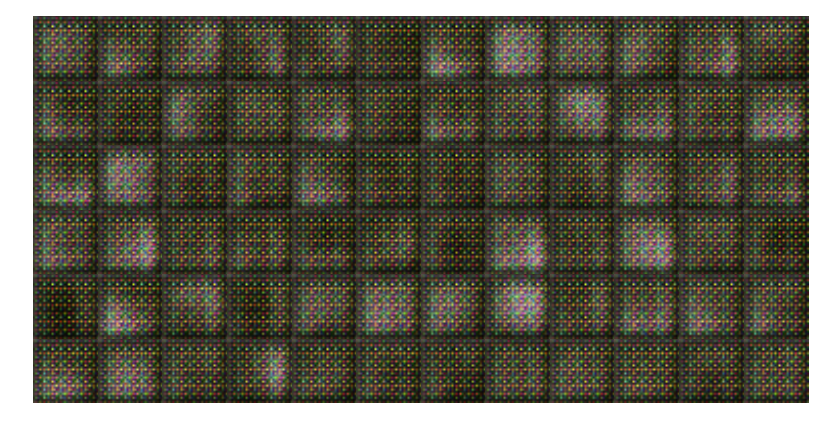

Epoch 2/25... Discriminator Loss: 0.7013... Generator Loss: 1.2008
Epoch 2/25... Discriminator Loss: 0.7840... Generator Loss: 1.1440
Epoch 2/25... Discriminator Loss: 0.6048... Generator Loss: 1.9452
Epoch 3/25... Discriminator Loss: 0.6950... Generator Loss: 1.1948
Epoch 3/25... Discriminator Loss: 1.1542... Generator Loss: 0.5645
Epoch 3/25... Discriminator Loss: 0.8641... Generator Loss: 1.0138
Epoch 3/25... Discriminator Loss: 0.9227... Generator Loss: 1.1921
Epoch 3/25... Discriminator Loss: 0.7527... Generator Loss: 1.0795
Epoch 3/25... Discriminator Loss: 0.6549... Generator Loss: 1.3351
Epoch 3/25... Discriminator Loss: 0.8782... Generator Loss: 0.8779


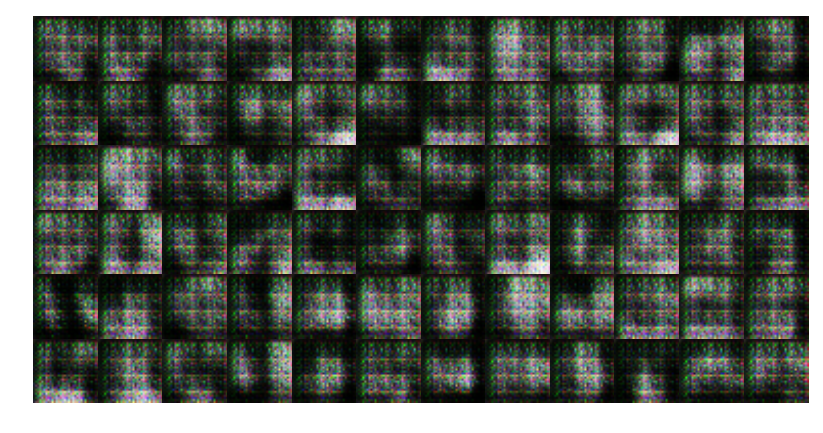

Epoch 4/25... Discriminator Loss: 1.0530... Generator Loss: 0.7723
Epoch 4/25... Discriminator Loss: 0.5285... Generator Loss: 1.5530
Epoch 4/25... Discriminator Loss: 0.5520... Generator Loss: 1.7526
Epoch 4/25... Discriminator Loss: 1.2563... Generator Loss: 0.8101
Epoch 4/25... Discriminator Loss: 0.6903... Generator Loss: 1.1806
Epoch 4/25... Discriminator Loss: 1.1535... Generator Loss: 0.6882
Epoch 5/25... Discriminator Loss: 1.9636... Generator Loss: 0.5759
Epoch 5/25... Discriminator Loss: 0.5055... Generator Loss: 1.3846
Epoch 5/25... Discriminator Loss: 0.7933... Generator Loss: 2.0404
Epoch 5/25... Discriminator Loss: 0.6033... Generator Loss: 1.8464


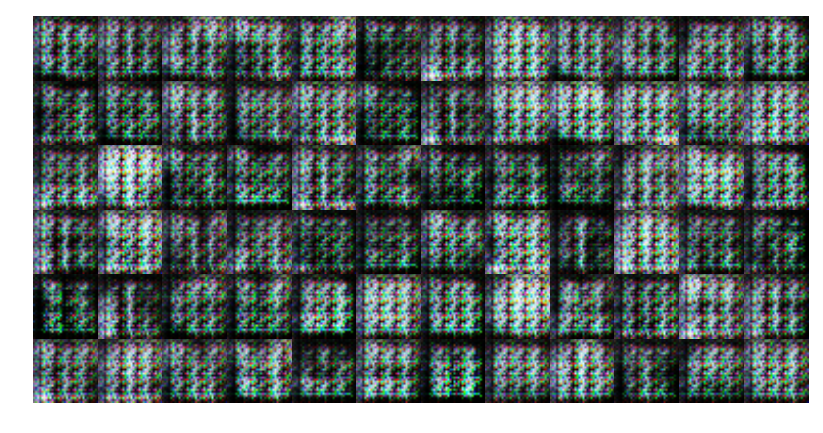

Epoch 5/25... Discriminator Loss: 0.5041... Generator Loss: 1.4895
Epoch 5/25... Discriminator Loss: 0.7738... Generator Loss: 0.8430
Epoch 5/25... Discriminator Loss: 0.7968... Generator Loss: 0.9994
Epoch 6/25... Discriminator Loss: 0.8026... Generator Loss: 0.7877
Epoch 6/25... Discriminator Loss: 1.0927... Generator Loss: 0.5945
Epoch 6/25... Discriminator Loss: 0.8582... Generator Loss: 1.0704
Epoch 6/25... Discriminator Loss: 1.1796... Generator Loss: 0.6435
Epoch 6/25... Discriminator Loss: 0.3926... Generator Loss: 1.8443
Epoch 6/25... Discriminator Loss: 0.6326... Generator Loss: 1.2465
Epoch 6/25... Discriminator Loss: 0.5492... Generator Loss: 1.3761


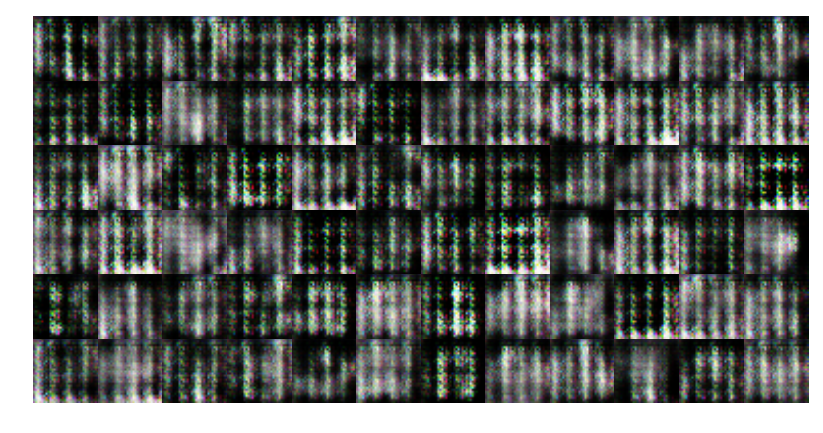

Epoch 7/25... Discriminator Loss: 0.5651... Generator Loss: 1.7024
Epoch 7/25... Discriminator Loss: 0.6861... Generator Loss: 1.0127
Epoch 7/25... Discriminator Loss: 0.8226... Generator Loss: 1.1530
Epoch 7/25... Discriminator Loss: 0.6939... Generator Loss: 1.0326
Epoch 7/25... Discriminator Loss: 0.7730... Generator Loss: 1.0230
Epoch 7/25... Discriminator Loss: 0.4994... Generator Loss: 1.8867
Epoch 8/25... Discriminator Loss: 1.0928... Generator Loss: 0.7381
Epoch 8/25... Discriminator Loss: 0.9237... Generator Loss: 1.2406
Epoch 8/25... Discriminator Loss: 0.5988... Generator Loss: 1.6173
Epoch 8/25... Discriminator Loss: 0.7307... Generator Loss: 1.2983


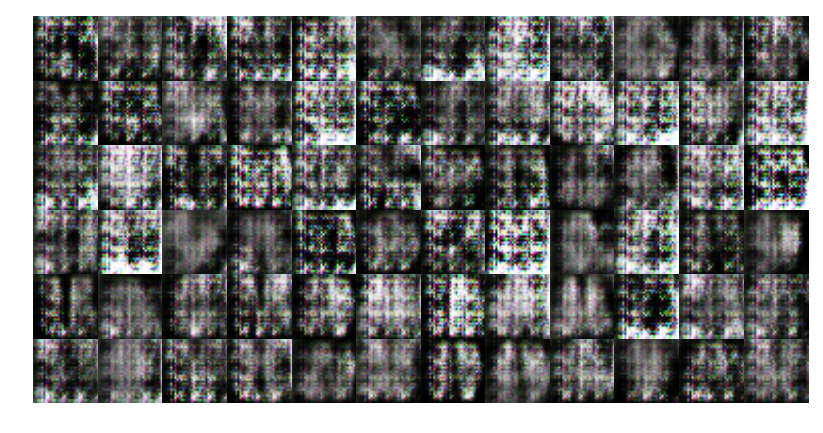

Epoch 8/25... Discriminator Loss: 1.1989... Generator Loss: 0.8923
Epoch 8/25... Discriminator Loss: 1.1952... Generator Loss: 0.7527
Epoch 8/25... Discriminator Loss: 0.6711... Generator Loss: 1.2692
Epoch 9/25... Discriminator Loss: 0.3903... Generator Loss: 2.1897
Epoch 9/25... Discriminator Loss: 0.6049... Generator Loss: 1.2387
Epoch 9/25... Discriminator Loss: 0.8499... Generator Loss: 0.8993
Epoch 9/25... Discriminator Loss: 0.9247... Generator Loss: 0.8318
Epoch 9/25... Discriminator Loss: 0.5678... Generator Loss: 1.2442
Epoch 9/25... Discriminator Loss: 0.6878... Generator Loss: 1.1405
Epoch 9/25... Discriminator Loss: 0.5971... Generator Loss: 1.1386


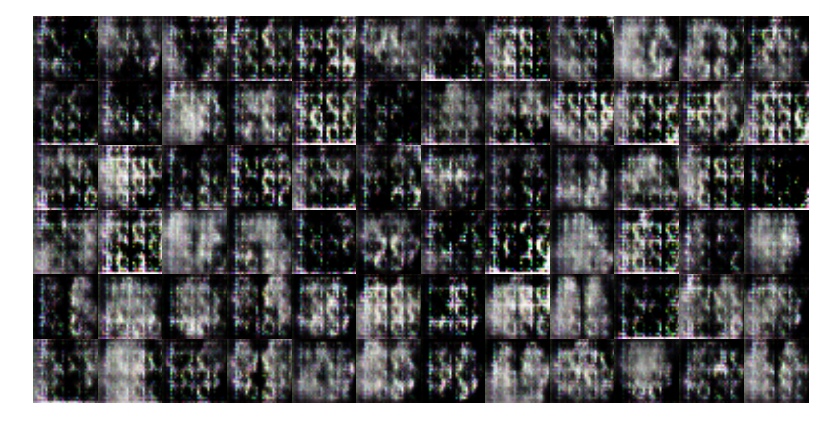

Epoch 10/25... Discriminator Loss: 0.4977... Generator Loss: 1.6832
Epoch 10/25... Discriminator Loss: 1.1317... Generator Loss: 0.5637
Epoch 10/25... Discriminator Loss: 0.5969... Generator Loss: 1.3213
Epoch 10/25... Discriminator Loss: 0.7474... Generator Loss: 1.7032
Epoch 10/25... Discriminator Loss: 0.6773... Generator Loss: 1.1520
Epoch 10/25... Discriminator Loss: 1.0465... Generator Loss: 0.5982
Epoch 10/25... Discriminator Loss: 0.4547... Generator Loss: 1.3350
Epoch 11/25... Discriminator Loss: 0.8661... Generator Loss: 0.7818
Epoch 11/25... Discriminator Loss: 0.9824... Generator Loss: 0.7069
Epoch 11/25... Discriminator Loss: 0.9733... Generator Loss: 0.6846


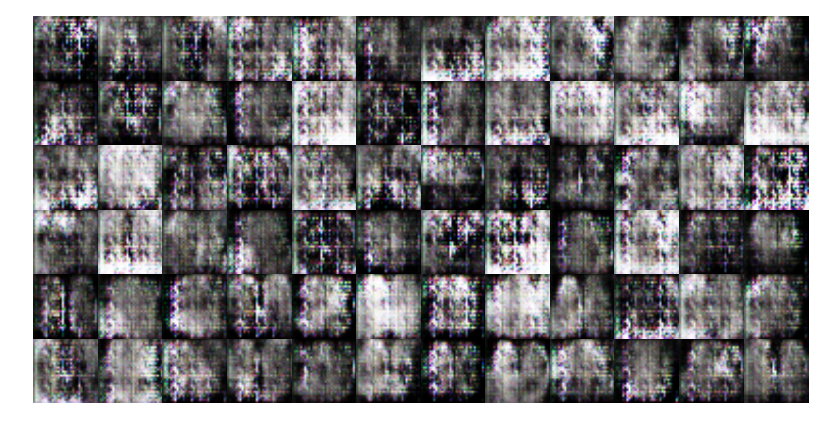

Epoch 11/25... Discriminator Loss: 0.3842... Generator Loss: 1.7194
Epoch 11/25... Discriminator Loss: 0.5617... Generator Loss: 1.1368
Epoch 11/25... Discriminator Loss: 0.7562... Generator Loss: 1.0257
Epoch 12/25... Discriminator Loss: 0.7578... Generator Loss: 1.1821
Epoch 12/25... Discriminator Loss: 1.0605... Generator Loss: 0.5862
Epoch 12/25... Discriminator Loss: 1.0242... Generator Loss: 0.6744
Epoch 12/25... Discriminator Loss: 0.7358... Generator Loss: 1.0825
Epoch 12/25... Discriminator Loss: 0.6892... Generator Loss: 1.2716
Epoch 12/25... Discriminator Loss: 1.0636... Generator Loss: 0.6358
Epoch 12/25... Discriminator Loss: 0.4637... Generator Loss: 1.6914


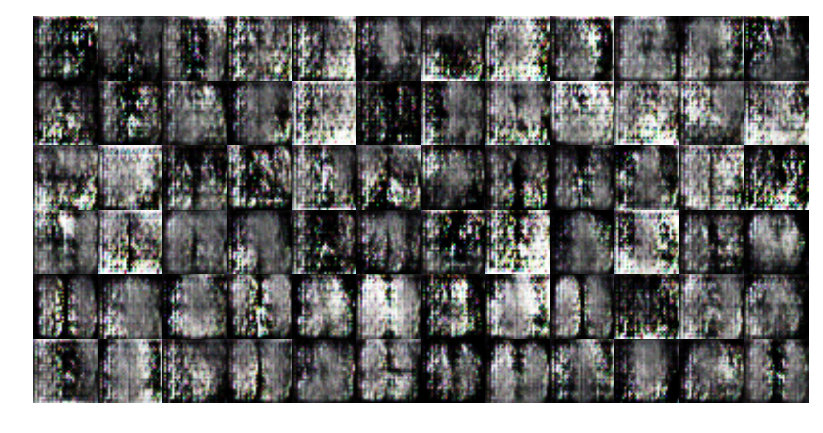

Epoch 13/25... Discriminator Loss: 1.0493... Generator Loss: 0.6047
Epoch 13/25... Discriminator Loss: 0.5379... Generator Loss: 1.2245
Epoch 13/25... Discriminator Loss: 0.9433... Generator Loss: 0.8995
Epoch 13/25... Discriminator Loss: 0.4666... Generator Loss: 2.4998
Epoch 13/25... Discriminator Loss: 0.4798... Generator Loss: 1.3764
Epoch 13/25... Discriminator Loss: 0.4710... Generator Loss: 1.3395
Epoch 13/25... Discriminator Loss: 0.8138... Generator Loss: 0.9165
Epoch 14/25... Discriminator Loss: 0.6281... Generator Loss: 1.7237
Epoch 14/25... Discriminator Loss: 0.5992... Generator Loss: 1.4408
Epoch 14/25... Discriminator Loss: 0.9166... Generator Loss: 0.8215


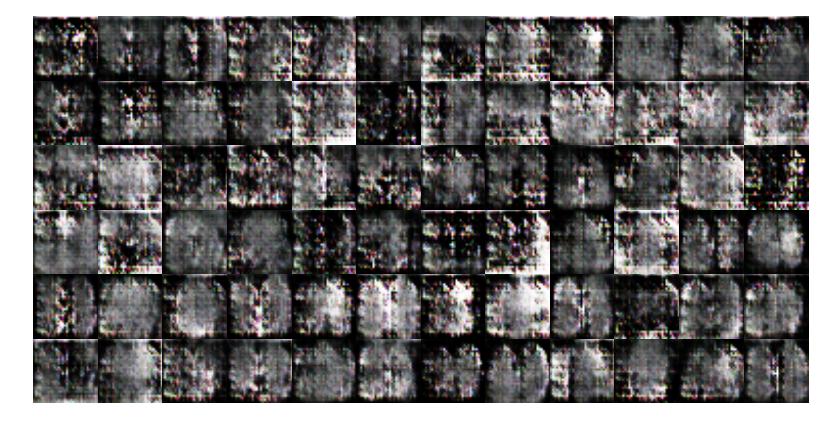

Epoch 14/25... Discriminator Loss: 0.5087... Generator Loss: 1.4501
Epoch 14/25... Discriminator Loss: 0.6690... Generator Loss: 2.0154
Epoch 14/25... Discriminator Loss: 0.9113... Generator Loss: 0.8168
Epoch 15/25... Discriminator Loss: 0.9652... Generator Loss: 0.5889
Epoch 15/25... Discriminator Loss: 0.6401... Generator Loss: 1.1053
Epoch 15/25... Discriminator Loss: 0.6040... Generator Loss: 2.2326
Epoch 15/25... Discriminator Loss: 0.5165... Generator Loss: 1.5334
Epoch 15/25... Discriminator Loss: 0.8106... Generator Loss: 0.8586
Epoch 15/25... Discriminator Loss: 0.8052... Generator Loss: 0.7982
Epoch 15/25... Discriminator Loss: 0.6911... Generator Loss: 1.2702


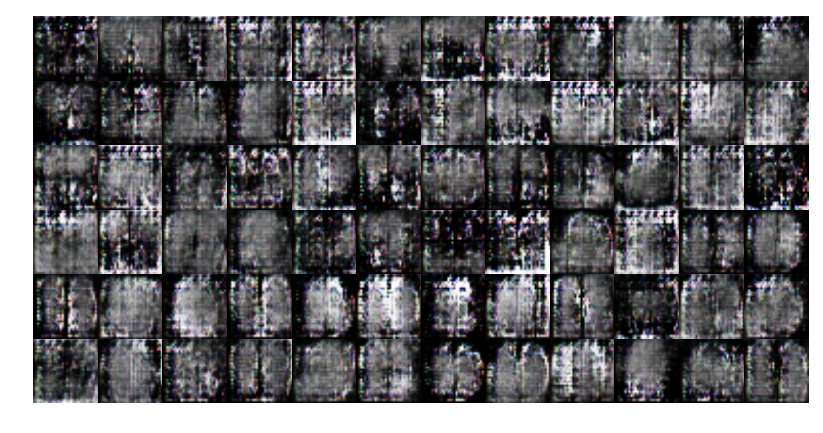

Epoch 16/25... Discriminator Loss: 0.4228... Generator Loss: 1.8890
Epoch 16/25... Discriminator Loss: 0.5981... Generator Loss: 1.5750
Epoch 16/25... Discriminator Loss: 0.3305... Generator Loss: 2.5636
Epoch 16/25... Discriminator Loss: 1.5487... Generator Loss: 0.4737
Epoch 16/25... Discriminator Loss: 1.2231... Generator Loss: 0.4775
Epoch 16/25... Discriminator Loss: 0.3888... Generator Loss: 1.7870
Epoch 16/25... Discriminator Loss: 0.5130... Generator Loss: 1.4623
Epoch 17/25... Discriminator Loss: 0.6796... Generator Loss: 1.5704
Epoch 17/25... Discriminator Loss: 0.7050... Generator Loss: 1.1456
Epoch 17/25... Discriminator Loss: 0.7581... Generator Loss: 1.1973


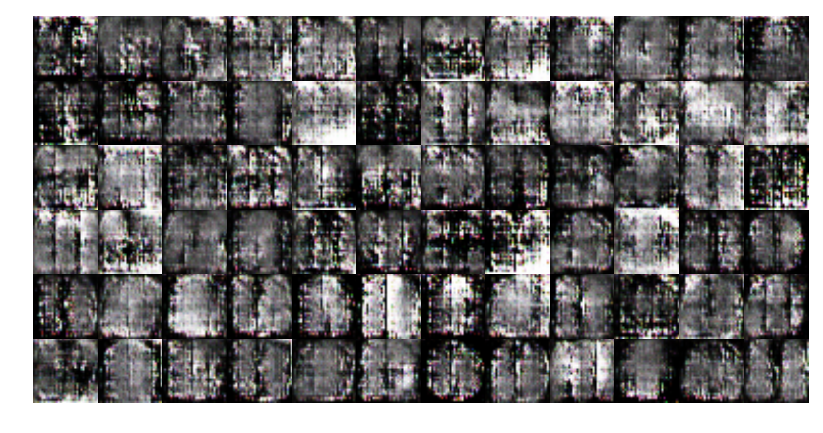

Epoch 17/25... Discriminator Loss: 0.7216... Generator Loss: 1.0921
Epoch 17/25... Discriminator Loss: 0.7395... Generator Loss: 1.0471
Epoch 17/25... Discriminator Loss: 0.7546... Generator Loss: 1.0445
Epoch 18/25... Discriminator Loss: 0.8504... Generator Loss: 0.8471
Epoch 18/25... Discriminator Loss: 1.2152... Generator Loss: 0.6458
Epoch 18/25... Discriminator Loss: 1.0629... Generator Loss: 0.7687
Epoch 18/25... Discriminator Loss: 1.9275... Generator Loss: 0.2822
Epoch 18/25... Discriminator Loss: 0.8906... Generator Loss: 0.7196
Epoch 18/25... Discriminator Loss: 0.8648... Generator Loss: 0.8129
Epoch 18/25... Discriminator Loss: 1.5175... Generator Loss: 0.3139


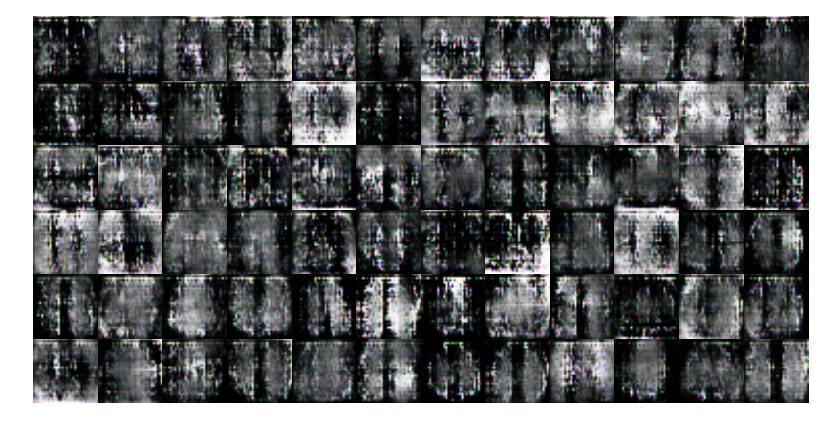

Epoch 19/25... Discriminator Loss: 0.5743... Generator Loss: 1.3223
Epoch 19/25... Discriminator Loss: 0.5701... Generator Loss: 1.3338
Epoch 19/25... Discriminator Loss: 0.7499... Generator Loss: 1.0890
Epoch 19/25... Discriminator Loss: 1.4166... Generator Loss: 0.4751
Epoch 19/25... Discriminator Loss: 1.0479... Generator Loss: 0.6455
Epoch 19/25... Discriminator Loss: 1.0068... Generator Loss: 0.6317
Epoch 19/25... Discriminator Loss: 0.6609... Generator Loss: 1.0476
Epoch 20/25... Discriminator Loss: 0.5668... Generator Loss: 1.8327
Epoch 20/25... Discriminator Loss: 0.6589... Generator Loss: 1.1387
Epoch 20/25... Discriminator Loss: 0.9161... Generator Loss: 0.7289


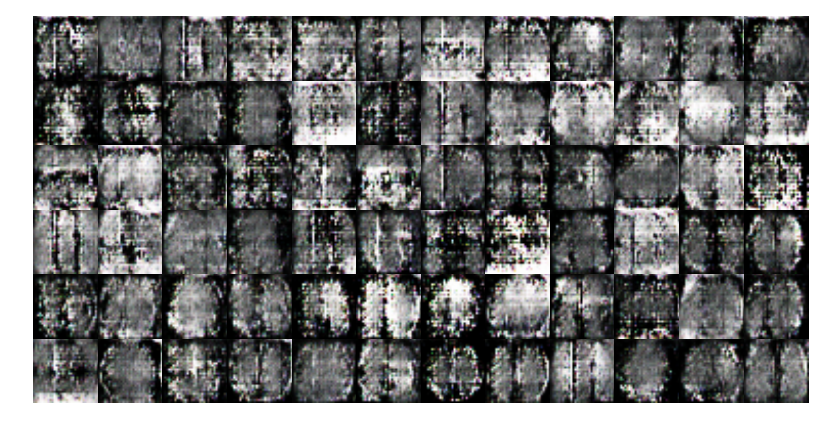

Epoch 20/25... Discriminator Loss: 0.3013... Generator Loss: 2.7360
Epoch 20/25... Discriminator Loss: 1.2354... Generator Loss: 0.4451
Epoch 20/25... Discriminator Loss: 0.9065... Generator Loss: 0.8055
Epoch 20/25... Discriminator Loss: 0.4627... Generator Loss: 1.1416
Epoch 21/25... Discriminator Loss: 0.3083... Generator Loss: 2.1921
Epoch 21/25... Discriminator Loss: 0.3754... Generator Loss: 1.9793
Epoch 21/25... Discriminator Loss: 0.8804... Generator Loss: 0.8210
Epoch 21/25... Discriminator Loss: 0.6989... Generator Loss: 1.0336
Epoch 21/25... Discriminator Loss: 1.5038... Generator Loss: 1.1144
Epoch 21/25... Discriminator Loss: 0.4007... Generator Loss: 2.1082


KeyboardInterrupt: 

In [244]:
dataset = Dataset(trainset, trainset)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))